#**DCGAN for generating cars**
----

In [3]:
!pip install torch==1.5.1+cu92 torchvision==0.6.1+cu92 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 604.8MB 28kB/s 
     |████████████████████████████████| 6.5MB 72.4MB/s 
  Found existing installation: torch 1.5.0
    Uninstalling torch-1.5.0:
      Successfully uninstalled torch-1.5.0
  Found existing installation: torchvision 0.7.0+cu101
    Uninstalling torchvision-0.7.0+cu101:
      Successfully uninstalled torchvision-0.7.0+cu101


In [4]:
import torch
print(torch.__version__)

1.5.1+cu92


In [5]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


# Data Preprocessing
---

In [ ]:
%cd 'gdrive/My Drive/E4P2/S6/'

/content/gdrive/My Drive/E4P2/S6


In [ ]:
!git clone https://github.com/genigarus/API.git

Cloning into 'API'...
remote: Enumerating objects: 75, done.
remote: Counting objects: 100% (75/75), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 75 (delta 9), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (75/75), done.


In [ ]:
import os
import pandas as pd
import numpy as np
 
from imutils import paths
from tqdm.notebook import tqdm
import PIL
from PIL import Image

In [ ]:
def resize_image(img, size):
    """
    Resize PIL image

    Resizes image to be square with sidelength size. Pads with black if needed.
    """
    # Resize
    n_x, n_y = img.size
    if n_y > n_x:
        n_y_new = size
        n_x_new = int(size * n_x / n_y + 0.5)
    else:
        n_x_new = size
        n_y_new = int(size * n_y / n_x + 0.5)

    img_res = img.resize((n_x_new, n_y_new), resample=PIL.Image.BICUBIC)

    # Pad the borders to create a square image
    img_pad = Image.new('RGB', (size, size), (255, 255, 255))
    ulc = ((size - n_x_new) // 2, (size - n_y_new) // 2)
    img_pad.paste(img_res, ulc)

    return img_pad

In [ ]:
def prep_images(dataset_path, out_dir, size):
    """
    Preprocess images

    Reads images in paths, and writes to out_dir

    """
    # get all the image paths
    image_paths = list(paths.list_images(dataset_path))
    for count, path in enumerate(image_paths):
        # if count % 100 == 0:
        # print(count)
        img = Image.open(path)
        #img_nrm = norm_image(img)
        img_res = resize_image(img, size)
        #basename = os.path.basename(path)image_paths = list(paths.list_images(dataset_path))
        # rel_path = os.path.join(out_dir, path.split(os.path.sep)[-2])
        if not os.path.exists(out_dir): #(rel_path):
          os.makedirs(out_dir) #(rel_path)
        path_out = os.path.join(out_dir, f"{count+1:03d}.{path.split('.')[-1]}")
        # print(path_out)
        # break
        img_res.save(path_out)
    print("Images preprocessed and saved.")

In [ ]:
dataset_path, out_dir, size = 'gdrive/My Drive/E4P2/S6/cars_dataset/', 'gdrive/My Drive/E4P2/S6/CarsDataset', 128
prep_images(dataset_path, out_dir, size)

Images preprocessed and saved.


In [ ]:
import numpy as np
def mean_std(dataset_path):
    n = 0
    s = np.zeros(3)
    sq = np.zeros(3)

    # get all the image paths
    image_paths = list(paths.list_images(dataset_path))

    for _, filename in tqdm(enumerate(image_paths)):
          img = Image.open(filename).convert('RGB')
          x = np.array(img)/255
          s += x.sum(axis=(0,1))
          sq += np.sum(np.square(x), axis=(0,1))
          n += x.shape[0]*x.shape[1]
    
    mu = s/n
    std = np.sqrt((sq/n - np.square(mu)))
    print(mu, sq/n, std, n)

    return mu, std

In [ ]:
mean, std = mean_std(dataset_path)


[0.68037374 0.66458744 0.6619388 ] [0.60214789 0.58125667 0.5818326 ] [0.37314805 0.37360434 0.37903776] 61294867


In [ ]:
print(f"Mean and Standard Deviation of preprocessed data: {mean}, {std}")

Mean and Standard Deviation of preprocessed data: [0.68037374 0.66458744 0.6619388 ], [0.37314805 0.37360434 0.37903776]


# Image Loading and Augmentation
---

In [6]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [11]:
dataroot = 'gdrive/My Drive/E4P2/S6/CarsDataset' #"data/celeba"
model_path = 'gdrive/My Drive/E4P2/S6/models'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1500

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

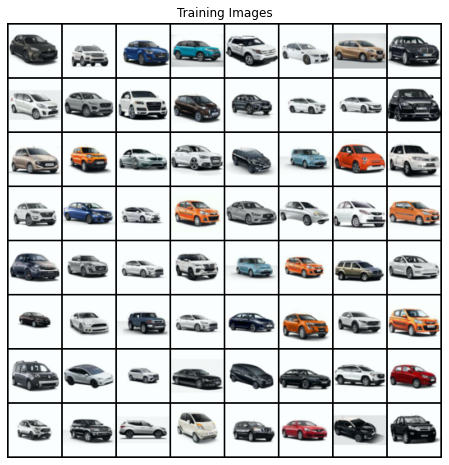

In [12]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.68037374, 0.66458744, 0.6619388), (0.37314805, 0.37360434, 0.37903776)), #((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

#Model Building
----

In [13]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [14]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [15]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [16]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [17]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [18]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [19]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            torch.save(netD.state_dict(), os.path.join(model_path, "Discriminator", f"netD_E{epoch:04d}_I{len(img_list)}.pth"))
            torch.save(netG.state_dict(), os.path.join(model_path, "Generator", f"netG_E{epoch:04d}_I{len(img_list)}.pth"))

        iters += 1
    if epoch % 25 == 0:
          torch.save(netD.state_dict(), os.path.join(model_path, "Discriminator", f"netD_E{epoch:04d}.pth"))
          torch.save(netG.state_dict(), os.path.join(model_path, "Generator", f"netG_E{epoch:04d}.pth"))

Starting Training Loop...
[0/1500][0/4]	Loss_D: 1.9218	Loss_G: 4.7908	D(x): 0.5856	D(G(z)): 0.6682 / 0.0139
[1/1500][0/4]	Loss_D: 0.1963	Loss_G: 6.4074	D(x): 0.9494	D(G(z)): 0.0822 / 0.0026
[2/1500][0/4]	Loss_D: 0.0769	Loss_G: 6.6561	D(x): 0.9729	D(G(z)): 0.0424 / 0.0022
[3/1500][0/4]	Loss_D: 0.0428	Loss_G: 7.6600	D(x): 0.9843	D(G(z)): 0.0252 / 0.0008
[4/1500][0/4]	Loss_D: 0.0737	Loss_G: 7.8103	D(x): 0.9773	D(G(z)): 0.0451 / 0.0007
[5/1500][0/4]	Loss_D: 0.0404	Loss_G: 8.3206	D(x): 0.9787	D(G(z)): 0.0161 / 0.0005
[6/1500][0/4]	Loss_D: 1.7956	Loss_G: 25.2692	D(x): 0.9906	D(G(z)): 0.7631 / 0.0000
[7/1500][0/4]	Loss_D: 1.2596	Loss_G: 21.2607	D(x): 1.0000	D(G(z)): 0.6065 / 0.0000
[8/1500][0/4]	Loss_D: 1.7346	Loss_G: 22.4438	D(x): 0.9992	D(G(z)): 0.7460 / 0.0000
[9/1500][0/4]	Loss_D: 0.0225	Loss_G: 6.6189	D(x): 0.9855	D(G(z)): 0.0041 / 0.0039
[10/1500][0/4]	Loss_D: 0.0571	Loss_G: 12.6026	D(x): 0.9649	D(G(z)): 0.0000 / 0.0000
[11/1500][0/4]	Loss_D: 0.1614	Loss_G: 15.9349	D(x): 0.9064	D(G(z)):

#Graphs
---

### Loss versus training iteration

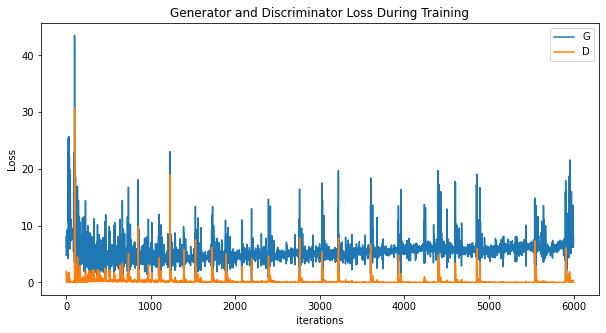

In [20]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Visualization of G's Progression

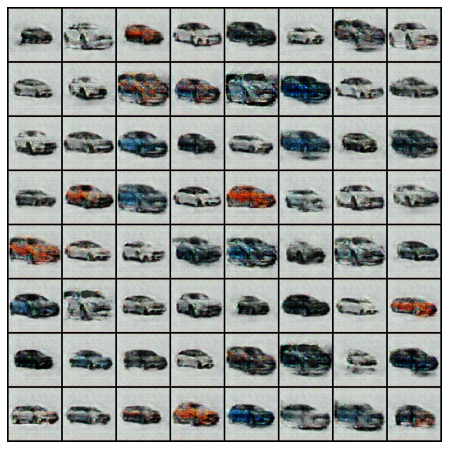

In [21]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

### Real Images vs Fake Images

In [22]:
len(img_list)

13

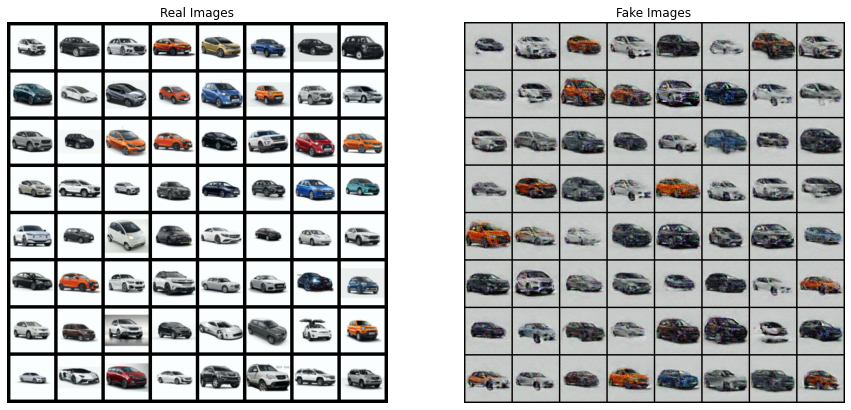

In [26]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[11],(1,2,0)))
plt.show()

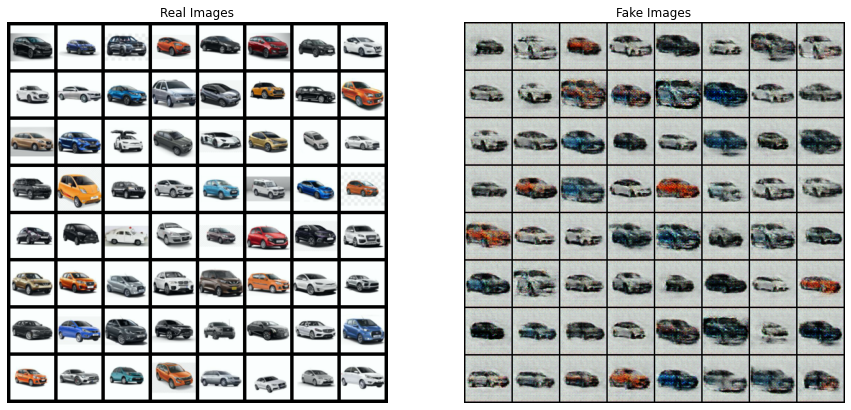

In [27]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

#Evaluation
---

In [15]:
dataroot = 'gdrive/My Drive/E4P2/S6/CarsDataset' #"data/celeba"
model_path = 'gdrive/My Drive/E4P2/S6/models'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1000

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [16]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

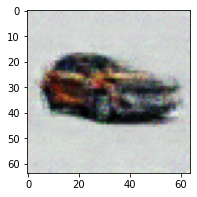

In [71]:
def generate_car(model_path):
  nz = 100
  ngpu = 1
  # Decide which device we want to run on
  device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

  # Create the generator
  netG = Generator(ngpu).to(device)
  netG.load_state_dict(torch.load(model_path))

  noise = torch.randn(1, nz, 1, 1, device=device)

  # Generate fake image batch with G
  fake = netG(noise).detach().cpu()
  img = vutils.make_grid(fake, padding=2, normalize=True)
  return img

img = generate_car("gdrive/My Drive/E4P2/S6/models/Generator/netG_E1375_I12.pth")
plt.figure(figsize=(3,3))
plt.imshow(np.transpose(img,(1,2,0)))

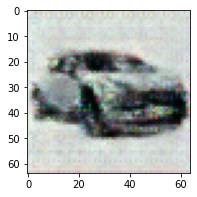

In [52]:
noise1 = torch.randn(1, nz, 1, 1, device=device)

# Generate fake image batch with G
fake1 = netG(noise1).detach().cpu()
img = vutils.make_grid(fake1, padding=2, normalize=True)
plt.figure(figsize=(3,3))
plt.imshow(np.transpose(img,(1,2,0)))

In [29]:
torch.save(netD.state_dict(), os.path.join(model_path, "Discriminator", f"netD_E1500.pth"))
torch.save(netG.state_dict(), os.path.join(model_path, "Generator", f"netG_E1500.pth"))